In [1]:
# Explores global clustering and additional annotation of global object
# Aiming to identify neutrophils and other cell types that may not be fully annotated i 'annot' column

In [21]:
import scanpy as sc
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib

import seaborn as sns

import celltypist
from celltypist import models

from matplotlib import rcParams

import squidpy as sq
import cellcharter as cc

In [3]:
adata = sc.read_h5ad("h5ad/scvi/xenium5k_scVI_CellCharter.h5ad")

In [4]:
sc.set_figure_params(dpi_save=300)

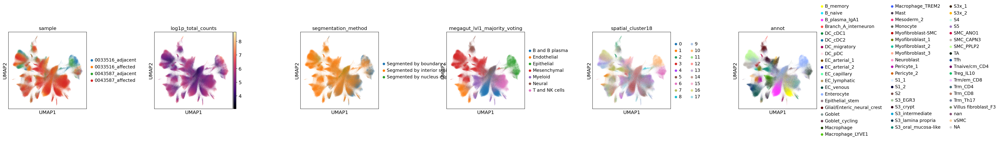

In [5]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,       
    color=['sample', 'log1p_total_counts', 'segmentation_method',
           
           'megagut_lvl1_majority_voting', 'spatial_cluster18', 'annot'],
#    palette=sc.pl.palettes.default_102,
    wspace=0.7,
    cmap='magma',
    ncols=6,
    save="_xenium5k_annotation_v1.pdf"
)

In [145]:
# Load CellTypist models with more detailed immune cell annotation
#models.download_models(force_update = True)

In [139]:
model = models.Model.load(model = 'Immune_All_Low.pkl')

In [143]:
#model

In [155]:
len(model.cell_types)

98

In [150]:
model.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [6]:
# Recluster global object at higher resolution
# To look for neutrophil clusters

In [118]:
sc.settings.figdir = "./figures_neutrophils/"

!mkdir figures_neutrophils

mkdir: cannot create directory ‘figures_neutrophils’: File exists


In [7]:
sc.pp.neighbors(adata, use_rep="X_scVI")

In [8]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [144]:
# Run CellTypist immune on joint Xenium 5k object
predictions = celltypist.annotate(adata, model="Immune_All_Low.pkl", majority_voting=True)

🔬 Input data has 646121 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 1924 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 30
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
🗳️ Majority voting the predictions
✅ Ma

In [146]:
# Store CellTypist output
adata = predictions.to_adata(prefix='Immune_All_Low_')

In [148]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [153]:
adata.obs.Immune_All_Low_predicted_labels.value_counts()

Immune_All_Low_predicted_labels
Tcm/Naive helper T cells       217945
Fibroblasts                     82471
Epithelial cells                40725
Endothelial cells               40335
Plasma cells                    39951
                                ...  
Cycling monocytes                  21
Neutrophils                        20
Kidney-resident macrophages        14
Late erythroid                      7
ILC2                                6
Name: count, Length: 98, dtype: int64

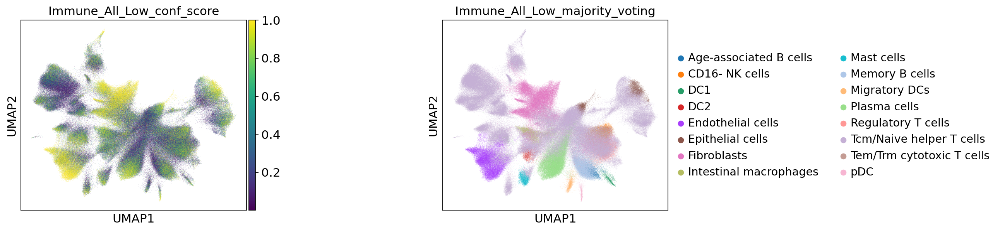

In [154]:
sc.pl.umap(
    adata,       
    color=['Immune_All_Low_conf_score', 'Immune_All_Low_majority_voting'],
#    palette=sc.pl.palettes.default_102,
    wspace=0.7,
#    cmap='magma',
    ncols=6,
    save="_xenium5k_annotation_v1_immune_all.pdf"
)

In [ ]:
# Clustering
sc.tl.leiden(adata, resolution=4.0, key_added='leiden4')  # runtime: 45m

In [13]:
sc.tl.leiden(adata, resolution=8.0, key_added='leiden8')  # runtime: 45m

In [38]:
sc.tl.leiden(adata, resolution=10.0, key_added='leiden10')  # runtime: 45m

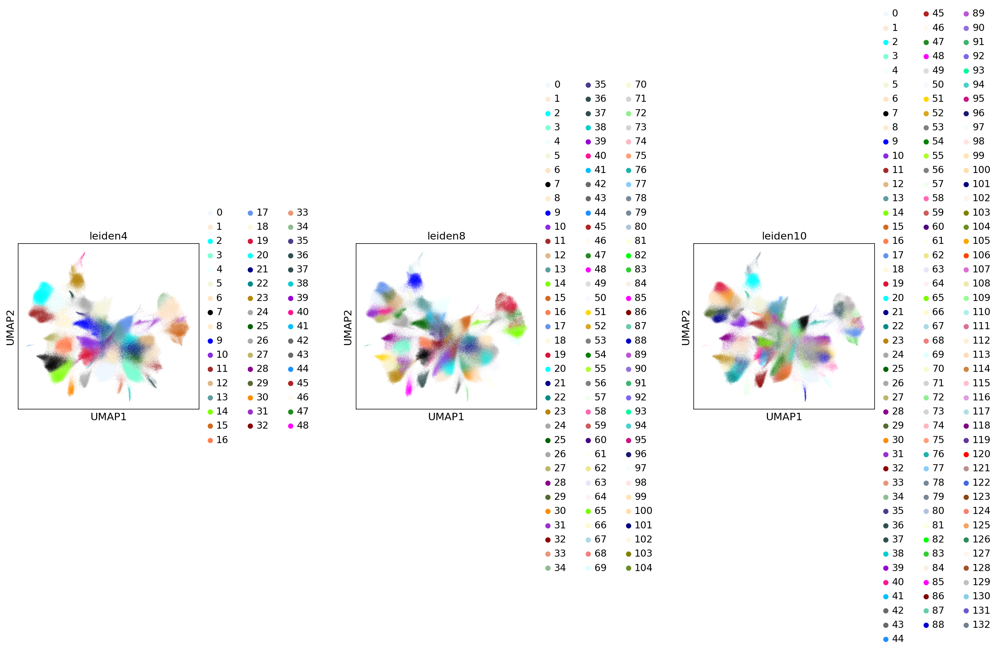

In [39]:
sc.pl.umap(
    adata,       
    color=['leiden4', 'leiden8', 'leiden10'],
#    palette=sc.pl.palettes.default_102,
    wspace=0.7,
    cmap='magma',
    ncols=6,
#    save="_xenium5k_annotation_v1.pdf"
    palette=list(matplotlib.colors.CSS4_COLORS.values())

)

In [ ]:
print("test")

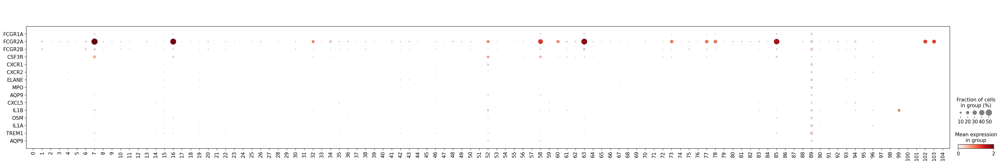

In [119]:
neutro_markers = [
    "FCGR1A",
    "FCGR2A",
    "FCGR2B",
    "CSF3R",
    "CXCR1",
    "CXCR2",
    "ELANE",
    "MPO",
    "AQP9",
    "CXCL5",
    "IL1B",
    "OSM",
    "IL1A",
    #"S100A8",
    "TREM1",
    "AQP9"]
sc.pl.dotplot(adata, neutro_markers, groupby='leiden8', swap_axes=True)

In [31]:
# sc.pl.dotplot(adata, neutro_markers, groupby='leiden4', swap_axes=True)

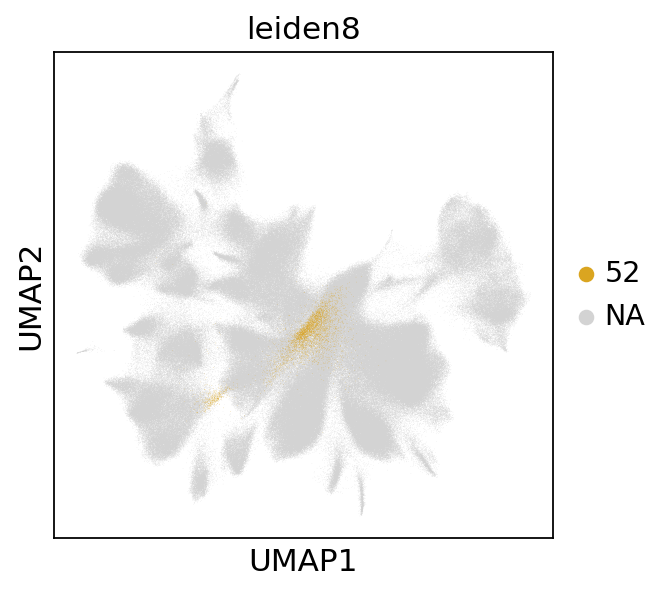

In [27]:
sc.pl.umap(
    adata,       
    color=['leiden8'],
#    groups=['52', '94', '96', '99'],
    groups=['52'],

#    palette=sc.pl.palettes.default_102,
    wspace=0.7,
#    cmap='magma',
    ncols=6,
#    save="_xenium5k_annotation_v1.pdf"
    palette=list(matplotlib.colors.CSS4_COLORS.values())
)

In [32]:
# sc.pl.umap(
#     adata,       
#     color=['leiden4'],
#     groups=['28', '43'],

# #    palette=sc.pl.palettes.default_102,
#     wspace=0.7,
# #    cmap='magma',
#     ncols=6,
# #    save="_xenium5k_annotation_v1.pdf"
#     palette=list(matplotlib.colors.CSS4_COLORS.values())
# )

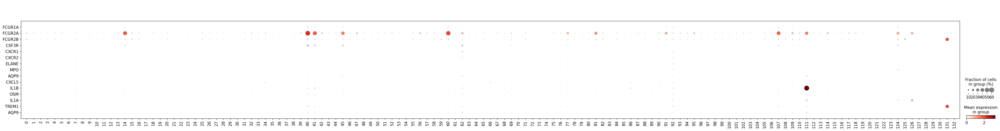

In [120]:
neutro_markers = [
    "FCGR1A",
    "FCGR2A",
    "FCGR2B",
    "CSF3R",
    "CXCR1",
    "CXCR2",
    "ELANE",
    "MPO",
    "AQP9",
    "CXCL5",
    "IL1B",
    "OSM",
    "IL1A",
    #"S100A8",
    "TREM1",
    "AQP9"]
sc.pl.dotplot(adata, neutro_markers, groupby='leiden10', swap_axes=True, save="neutrophil_markers.pdf")

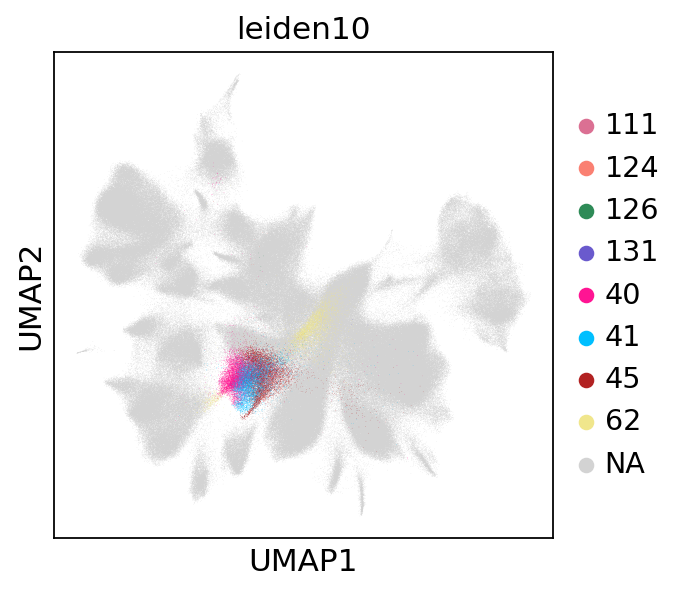

In [121]:
sc.pl.umap(
    adata,       
    color=['leiden10'],
    groups=['40', '41', '45', '62', '111', '124', '126', '131'],

#    palette=sc.pl.palettes.default_102,
    wspace=0.7,
#    cmap='magma',
    ncols=6,
#    save="_xenium5k_annotation_v1.pdf"
    palette=list(matplotlib.colors.CSS4_COLORS.values()),
    save="_neutrophil_markers.pdf"
)

In [108]:
#adata_sub = adata[adata.obs.leiden8 == '52']
#adata_sub = adata[adata.obs.leiden10 == '111']
#adata_sub = adata[adata.obs.leiden10 == '62']
#adata_sub = adata[adata.obs.leiden10.isin(['62', '111'])]

#clust_sel = ['40', '41', '45', '62', '77', '86', '111']

#clust_sel = ['40', '41', '45', '62', '77', '111']

clust_sel = ['40', '41', '45', '62', '111']

adata_sub = adata[adata.obs.leiden10.isin(clust_sel)]

In [109]:
adata_sub

View of AnnData object with n_obs × n_vars = 26300 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S

In [110]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [111]:
# UMAP
sc.tl.umap(adata_sub)

In [112]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

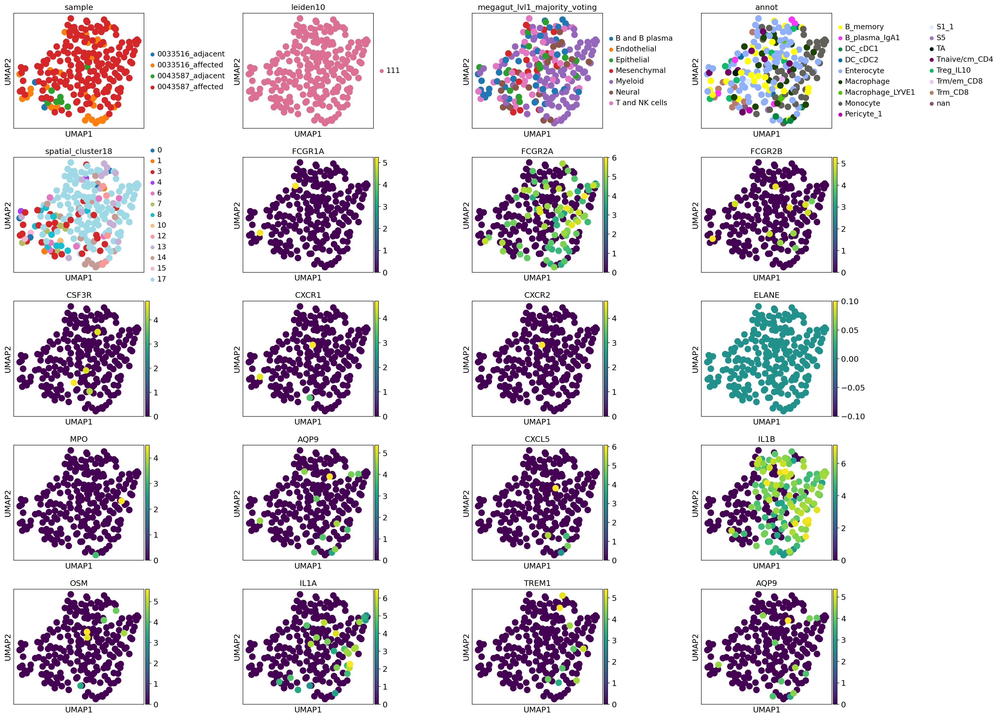

In [137]:
rcParams["figure.figsize"] = (4, 4)
sc.set_figure_params(dpi_save=150)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden10", "megagut_lvl1_majority_voting", "annot", "spatial_cluster18",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO",
        "AQP9",
        "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
], 
    wspace=0.6,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
    save="_neutrophil_cluster_candidates.pdf"
)

In [127]:
adata_sub.obs.annot.value_counts()

annot
Macrophage                    7499
Monocyte                      6534
Enterocyte                    4366
Macrophage_LYVE1              1641
B_memory                      1355
DC_cDC2                       1190
DC_cDC1                        900
Tnaive/cm_CD4                  626
Trm_CD8                        338
Treg_IL10                      294
B_plasma_IgA1                  255
Trm/em_CD8                     219
EC_venous                      206
Macrophage_TREM2               153
nan                            131
S4                             116
DC_migratory                    85
Villus fibroblast_F3            85
Trm_Th17                        83
S3_crypt                        34
S3_oral_mucosa-like             30
SMC_PPLP2                       19
EC_arterial_2                   19
S5                              14
EC_capillary                    12
EC_lymphatic                    10
Pericyte_1                       9
B_naive                          7
SMC_CAPN3     

In [114]:
adata.obs.sample = adata.obs['sample']

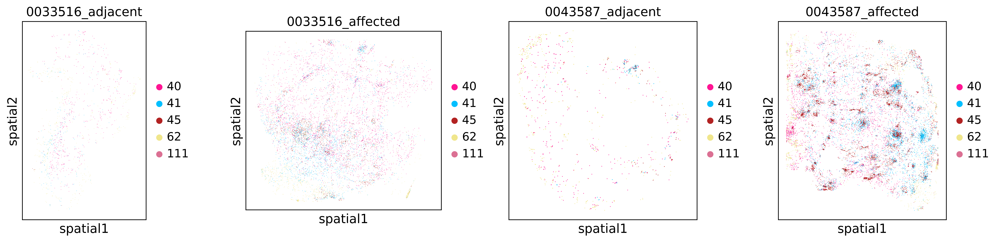

In [125]:
rcParams["figure.figsize"] = (6, 6)
sc.set_figure_params(dpi_save=300)

sq.pl.spatial_scatter(
    adata, 
    color='leiden10',
    #groups=['62', '111'],
    groups=clust_sel,
    library_key='sample', 
    img=None, 
    title=adata.obs.sample.cat.categories,
    size=8,
    ncols=4,
    library_id=adata.obs.sample.cat.categories,
    save="spatial_neutrophil_candidates.pdf",
    dpi=300
)

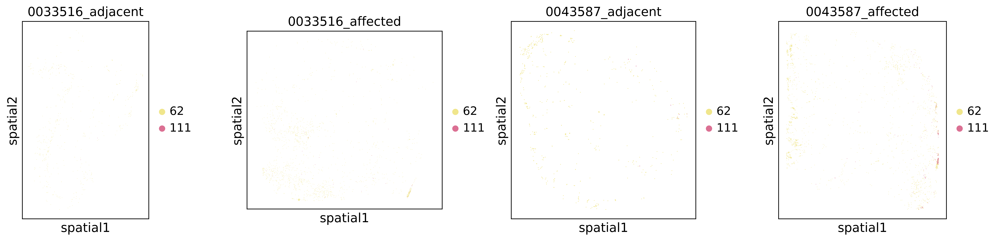

In [126]:
rcParams["figure.figsize"] = (6, 6)
sc.set_figure_params(dpi_save=300)

sq.pl.spatial_scatter(
    adata, 
    color='leiden10',
    groups=['62', '111'],
    #groups=clust_sel,
    library_key='sample', 
    img=None, 
    title=adata.obs.sample.cat.categories,
    size=8,
    ncols=4,
    library_id=adata.obs.sample.cat.categories,
    save="spatial_neutrophil_candidates_top.pdf",
    dpi=300
)

In [128]:
adata_sub = adata[adata.obs.leiden10 == '111']


In [129]:
adata_sub

View of AnnData object with n_obs × n_vars = 223 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x

In [130]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [131]:
# UMAP
sc.tl.umap(adata_sub)

In [132]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

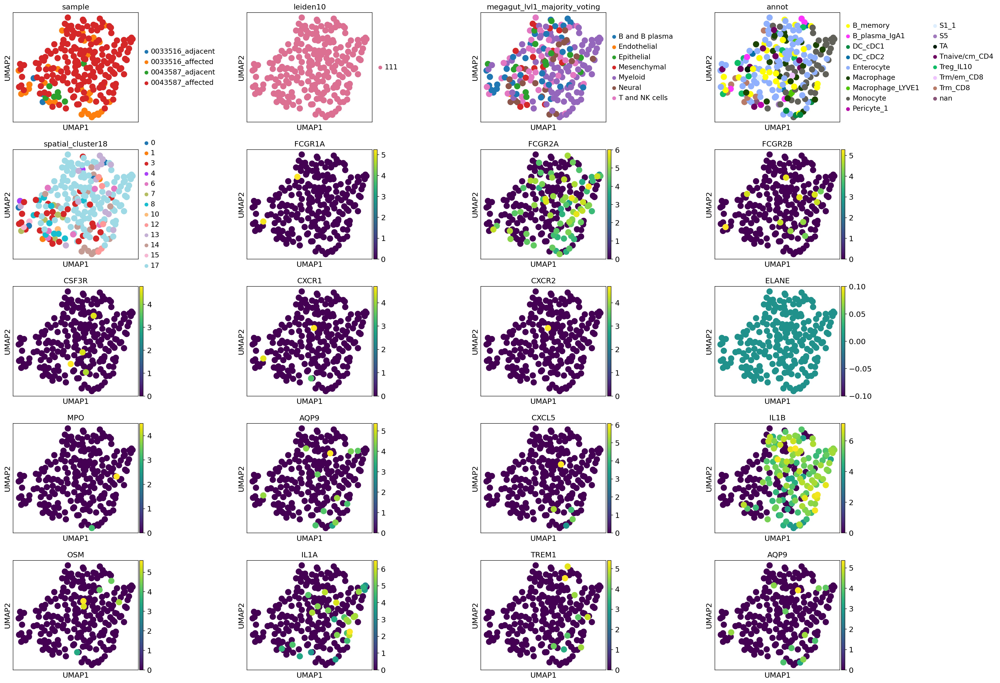

In [135]:
rcParams["figure.figsize"] = (4, 4)
sc.set_figure_params(dpi_save=150)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden10", "megagut_lvl1_majority_voting", "annot", "spatial_cluster18",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO",
        "AQP9",
         "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
    save="_neutrophil_cluster111.pdf"
)

In [156]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [157]:
adata.write_h5ad("h5ad/scvi/xenium5k_scVI_CellCharter_clustImmune.h5ad")